In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [3]:
x = pd.read_csv("TASK-ML-INTERN.csv")
x.shape

(500, 450)

In [4]:
x.head()

,hsi_id,0,1,2,3,4,5,6,7,8,...,439,440,441,442,443,444,445,446,447,vomitoxin_ppb
0,imagoai_corn_0,0.416181,0.396844,0.408985,0.372865,0.385293,0.365390,0.355226,0.343350,0.344837,...,0.710280,0.717482,0.715078,0.705379,0.696691,0.692793,0.711369,0.697679,0.704520,1100.0
1,imagoai_corn_1,0.415797,0.402956,0.402564,0.396014,0.397192,0.389634,0.375671,0.363689,0.373883,...,0.684011,0.697271,0.701995,0.696077,0.701012,0.677418,0.696921,0.696544,0.689054,1000.0
2,imagoai_corn_2,0.389023,0.371206,0.373098,0.373872,0.361056,0.349709,0.333882,0.330841,0.328925,...,0.683054,0.669286,0.663179,0.676165,0.676591,0.655951,0.658945,0.670989,0.665176,1300.0
3,imagoai_corn_3,0.468837,0.473255,0.462949,0.459335,0.461672,0.459824,0.458194,0.427737,0.415360,...,0.742782,0.730801,0.736787,0.730044,0.751437,0.738497,0.742446,0.754657,0.733474,1300.0
4,imagoai_corn_4,0.483352,0.487274,0.469153,0.487648,0.464026,0.451152,0.458229,0.440782,0.426193,...,0.770227,0.773013,0.761431,0.763488,0.762473,0.744012,0.775486,0.760431,0.751988,220.0


In [5]:
x.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Columns: 450 entries, hsi_id to vomitoxin_ppb
dtypes: float64(449), object(1)
memory usage: 1.7+ MB


** Initial Dataset Analysis: **
The dataset contains 500 rows and 450 columns.
The first column (hsi_id) appears to be an identifier for each corn sample.
The next 448 columns represent spectral reflectance values across different wavelength bands.
The final column (vomitoxin_ppb) is the target variable, representing the DON concentration in parts per billion (ppb).

In [10]:
#Finding the duplicates
x.duplicated().value_counts()

False    500
Name: count, dtype: int64

In [11]:
#Missing values
x.isna().sum()

hsi_id           0
0                0
1                0
2                0
3                0
                ..
444              0
445              0
446              0
447              0
vomitoxin_ppb    0
Length: 450, dtype: int64

In [12]:
#statistics of spectral reflectance values and target variable
x.iloc[:, 1:].describe()

,0,1,2,3,4,5,6,7,8,9,...,439,440,441,442,443,444,445,446,447,vomitoxin_ppb
count,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,...,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000
mean,0.443118,0.440761,0.433814,0.426122,0.418990,0.412432,0.405868,0.399815,0.394038,0.389664,...,0.741255,0.740818,0.740459,0.739758,0.739850,0.738738,0.738298,0.737599,0.738099,3410.006000
std,0.044719,0.045520,0.045764,0.046070,0.045405,0.044727,0.044528,0.043773,0.043659,0.043442,...,0.053479,0.053695,0.053812,0.053666,0.053487,0.053601,0.054014,0.054136,0.054297,13095.803483
min,0.311182,0.295321,0.284064,0.282054,0.296702,0.286860,0.262876,0.278523,0.255529,0.261459,...,0.562662,0.585011,0.558412,0.571735,0.575259,0.571767,0.577803,0.576985,0.562302,0.000000
25%,0.410456,0.404310,0.397038,0.389029,0.382102,0.377157,0.369620,0.364823,0.360634,0.355246,...,0.702105,0.703701,0.702988,0.700889,0.701690,0.700638,0.698655,0.698107,0.699673,137.500000
50%,0.449105,0.442651,0.434215,0.425074,0.417075,0.411872,0.405443,0.397917,0.393803,0.387211,...,0.743857,0.745922,0.745062,0.743991,0.744004,0.743965,0.743301,0.745216,0.745733,500.000000
75%,0.480245,0.478822,0.473158,0.464947,0.459232,0.452198,0.444384,0.438728,0.431165,0.427039,...,0.777884,0.776210,0.777069,0.774759,0.775698,0.775686,0.775621,0.774635,0.774310,1700.000000
max,0.556287,0.530168,0.528774,0.533202,0.511909,0.501786,0.504054,0.490692,0.489272,0.472080,...,0.940642,0.940361,0.939153,0.930366,0.942615,0.945225,0.932812,0.931381,0.957860,131000.000000


In [14]:
# Extract spectral data (excluding 'hsi_id' and target variable)
spectral_data = x.iloc[:, 1:-1]
spectral_data

,0,1,2,3,4,5,6,7,8,9,...,438,439,440,441,442,443,444,445,446,447
0,0.416181,0.396844,0.408985,0.372865,0.385293,0.365390,0.355226,0.343350,0.344837,0.361567,...,0.680883,0.710280,0.717482,0.715078,0.705379,0.696691,0.692793,0.711369,0.697679,0.704520
1,0.415797,0.402956,0.402564,0.396014,0.397192,0.389634,0.375671,0.363689,0.373883,0.359674,...,0.701600,0.684011,0.697271,0.701995,0.696077,0.701012,0.677418,0.696921,0.696544,0.689054
2,0.389023,0.371206,0.373098,0.373872,0.361056,0.349709,0.333882,0.330841,0.328925,0.323854,...,0.671400,0.683054,0.669286,0.663179,0.676165,0.676591,0.655951,0.658945,0.670989,0.665176
3,0.468837,0.473255,0.462949,0.459335,0.461672,0.459824,0.458194,0.427737,0.415360,0.413106,...,0.728588,0.742782,0.730801,0.736787,0.730044,0.751437,0.738497,0.742446,0.754657,0.733474
4,0.483352,0.487274,0.469153,0.487648,0.464026,0.451152,0.458229,0.440782,0.426193,0.430482,...,0.779194,0.770227,0.773013,0.761431,0.763488,0.762473,0.744012,0.775486,0.760431,0.751988
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,0.478140,0.444033,0.442120,0.437473,0.428672,0.413238,0.417758,0.420388,0.413290,0.402912,...,0.741594,0.747858,0.730535,0.716969,0.739297,0.724827,0.720484,0.740626,0.740116,0.721839
496,0.409367,0.394941,0.380236,0.375340,0.346122,0.354650,0.361170,0.342974,0.352137,0.327545,...,0.642285,0.670232,0.659045,0.661587,0.658422,0.644254,0.646479,0.656779,0.646700,0.646733
497,0.486526,0.501372,0.500175,0.508139,0.489411,0.457311,0.462321,0.462927,0.442647,0.437731,...,0.784919,0.787532,0.780347,0.768362,0.771411,0.770919,0.761464,0.770314,0.763324,0.797187
498,0.464595,0.498822,0.489077,0.453381,0.487636,0.461950,0.461671,0.447362,0.451952,0.427200,...,0.748725,0.739432,0.759722,0.752118,0.761910,0.761111,0.730431,0.753545,0.749619,0.756383


In [15]:
# Compute the mean reflectance across all samples for each wavelength
mean_reflectance = spectral_data.mean()
mean_reflectance

0      0.443118
1      0.440761
2      0.433814
3      0.426122
4      0.418990
         ...   
443    0.739850
444    0.738738
445    0.738298
446    0.737599
447    0.738099
Length: 448, dtype: float64

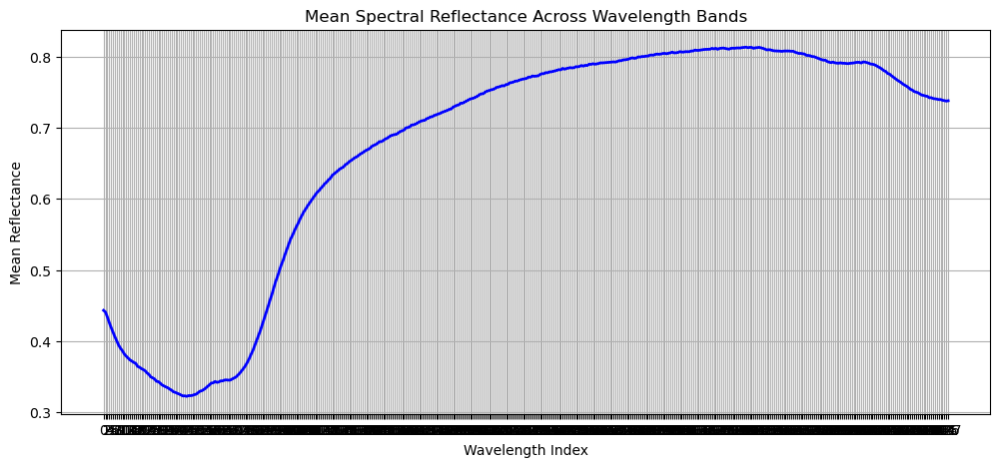

In [19]:
# Plot the mean spectral reflectance
plt.figure(figsize=(12, 5))
plt.plot(mean_reflectance, color='blue', linewidth=2)
plt.xlabel("Wavelength Index")
plt.ylabel("Mean Reflectance")
plt.title("Mean Spectral Reflectance Across Wavelength Bands")
plt.grid(True)
plt.show()

Visualizes the spectral reflectance by plotting the mean reflectance across samples.

Spectral Reflectance Trends:
The reflectance values show a smooth curve across wavelength bands.
There are some dips and peaks, which might correspond to specific absorption characteristics of corn samples.

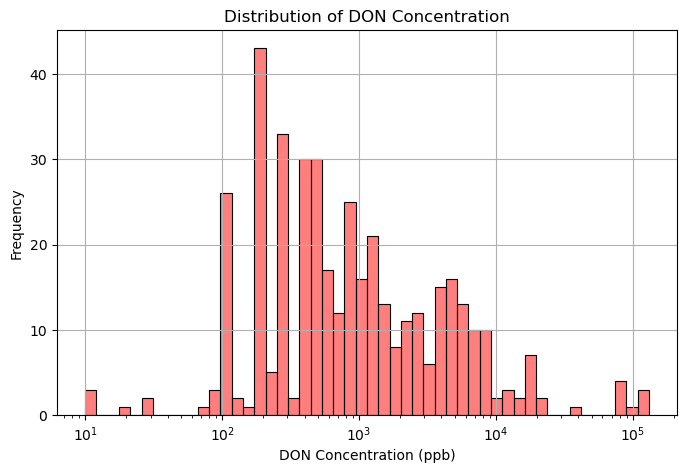

In [20]:
# Plot the distribution of the target variable (vomitoxin_ppb)
plt.figure(figsize=(8, 5))
sns.histplot(x["vomitoxin_ppb"], bins=50, kde=True, color='red', log_scale=True)
plt.xlabel("DON Concentration (ppb)")
plt.ylabel("Frequency")
plt.title("Distribution of DON Concentration")
plt.grid(True)
plt.show()

In [ ]:
Plots the distribution of DON concentration with a log scale to check for skewness.

Target Variable (DON Concentration) Distribution:
The distribution is highly skewed (right-skewed).
A log transformation might help normalize it for better regression performance.                                                                   

## **Building ML model :**
* *Step -1 :* Data Preprocessing
* *Step -2 :* Feature Selection
* *Step -3 :* Assigning Target and Predictor
* *Step -4 :* 
* *Step -5 :*
* *Step -6 :*
* *Step -7 :*

## Data Preprocessing

In [22]:
x.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Columns: 450 entries, hsi_id to vomitoxin_ppb
dtypes: float64(449), object(1)
memory usage: 1.7+ MB


In [24]:
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer

# Extract spectral reflectance features
X = x.iloc[:, 1:-1]  # Select only numerical data

# Define the column transformer with StandardScaler
ct = ColumnTransformer(transformers=[('num', StandardScaler(), list(range(X.shape[1])))]) 

# Apply transformation
X_transformed = ct.fit_transform(X)

In [25]:
# Convert back to DataFrame (optional, for readability)
X_transformed_df = pd.DataFrame(X_transformed, columns=X.columns)

# Display first few rows of the transformed data
X_transformed_df.head()

,0,1,2,3,4,5,6,7,8,9,...,438,439,440,441,442,443,444,445,446,447
0,-0.602959,-0.965751,-0.543093,-1.157165,-0.742877,-1.052805,-1.138474,-1.291257,-1.128080,-0.647413,...,-1.136301,-0.579796,-0.435043,-0.472136,-0.641236,-0.807712,-0.858033,-0.499055,-0.738140,-0.619071
1,-0.611562,-0.831331,-0.683547,-0.654183,-0.480564,-0.510221,-0.678841,-0.826155,-0.462121,-0.691024,...,-0.754022,-1.071488,-0.811826,-0.715506,-0.814737,-0.726845,-1.145151,-0.766827,-0.759125,-0.904192
2,-1.210868,-1.529537,-1.328061,-1.135296,-1.277202,-1.403752,-1.618288,-1.577331,-1.492895,-1.516409,...,-1.311275,-1.089395,-1.333533,-1.437541,-1.186149,-1.183869,-1.546059,-1.470599,-1.231647,-1.344393
3,0.575693,0.714559,0.637270,0.721659,0.940964,1.060639,1.176304,0.638522,0.488863,0.540156,...,-0.256030,0.028574,-0.186753,-0.068313,-0.181179,0.216860,-0.004504,0.076859,0.315411,-0.085268
4,0.900614,1.022832,0.772988,1.336847,0.992857,0.866564,1.177082,0.936845,0.737234,0.940551,...,0.677745,0.542282,0.600180,0.390096,0.442627,0.423396,0.098487,0.689182,0.422178,0.256052


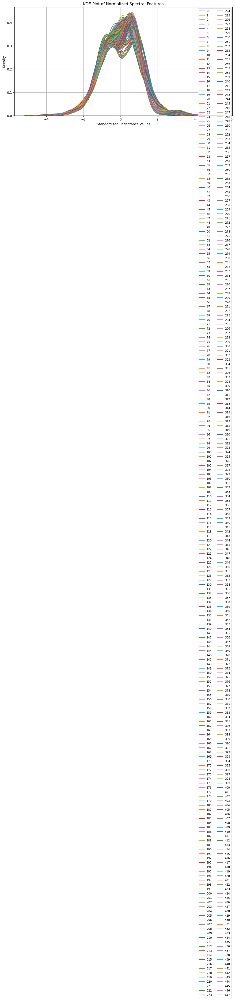

In [27]:
# Plot KDE for each normalized spectral feature
plt.figure(figsize=(12, 6))
for col in X_transformed_df.columns:
    sns.kdeplot(x=X_transformed_df[col], label=col)
plt.xlabel("Standardized Reflectance Values")
plt.ylabel("Density")
plt.title("KDE Plot of Normalized Spectral Features")
plt.legend(loc="upper right", fontsize="small", ncol=2)
plt.grid(True)
plt.show()


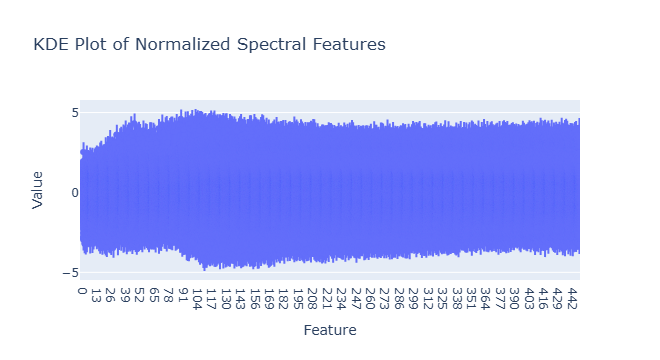

In [31]:
# Convert transformed data into long format for Plotly
X_long_df = X_transformed_df.melt(var_name="Feature", value_name="Value")
# Create interactive KDE plot
fig = px.violin(X_long_df, x="Feature", y="Value", box=True, points="all", title="KDE Plot of Normalized Spectral Features")
fig.show()


Uses plotly.express.violin() instead of KDE to show distributions interactively.
Includes box plots and scatter points for better visualization.
Hovering over the plot provides feature-wise density details.

## Feature Selection :
1.Correlation
2.Chi Square Test
3.Mutual Information
4.Varaiance Threshold
5.Recursive Feature Elimination
6.Decision Tree

## Correlation


In [32]:
X_transformed_df.head()

,0,1,2,3,4,5,6,7,8,9,...,438,439,440,441,442,443,444,445,446,447
0,-0.602959,-0.965751,-0.543093,-1.157165,-0.742877,-1.052805,-1.138474,-1.291257,-1.128080,-0.647413,...,-1.136301,-0.579796,-0.435043,-0.472136,-0.641236,-0.807712,-0.858033,-0.499055,-0.738140,-0.619071
1,-0.611562,-0.831331,-0.683547,-0.654183,-0.480564,-0.510221,-0.678841,-0.826155,-0.462121,-0.691024,...,-0.754022,-1.071488,-0.811826,-0.715506,-0.814737,-0.726845,-1.145151,-0.766827,-0.759125,-0.904192
2,-1.210868,-1.529537,-1.328061,-1.135296,-1.277202,-1.403752,-1.618288,-1.577331,-1.492895,-1.516409,...,-1.311275,-1.089395,-1.333533,-1.437541,-1.186149,-1.183869,-1.546059,-1.470599,-1.231647,-1.344393
3,0.575693,0.714559,0.637270,0.721659,0.940964,1.060639,1.176304,0.638522,0.488863,0.540156,...,-0.256030,0.028574,-0.186753,-0.068313,-0.181179,0.216860,-0.004504,0.076859,0.315411,-0.085268
4,0.900614,1.022832,0.772988,1.336847,0.992857,0.866564,1.177082,0.936845,0.737234,0.940551,...,0.677745,0.542282,0.600180,0.390096,0.442627,0.423396,0.098487,0.689182,0.422178,0.256052


In [33]:
X_transformed_df.corr()

,0,1,2,3,4,5,6,7,8,9,...,438,439,440,441,442,443,444,445,446,447
0,1.000000,0.950193,0.939032,0.936436,0.939845,0.932877,0.929035,0.919274,0.926197,0.919924,...,0.664437,0.663732,0.679829,0.670432,0.669160,0.678192,0.663484,0.665115,0.678180,0.673962
1,0.950193,1.000000,0.947421,0.942850,0.940810,0.941707,0.932305,0.927004,0.929760,0.929151,...,0.675444,0.677479,0.687372,0.680678,0.683569,0.686211,0.671872,0.676445,0.686367,0.682848
2,0.939032,0.947421,1.000000,0.944810,0.944345,0.942053,0.937859,0.932574,0.931288,0.931257,...,0.683010,0.681920,0.691687,0.687939,0.688620,0.696341,0.677799,0.681920,0.692196,0.695569
3,0.936436,0.942850,0.944810,1.000000,0.946280,0.945929,0.935430,0.937877,0.935082,0.927987,...,0.701426,0.700152,0.707781,0.698630,0.699114,0.707400,0.688762,0.695613,0.701369,0.706403
4,0.939845,0.940810,0.944345,0.946280,1.000000,0.946352,0.945448,0.938435,0.938747,0.937692,...,0.674005,0.682960,0.690370,0.677965,0.682754,0.695040,0.671909,0.677817,0.685099,0.689308
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
443,0.678192,0.686211,0.696341,0.707400,0.695040,0.703088,0.709468,0.728273,0.742171,0.739562,...,0.964291,0.968221,0.967652,0.970079,0.970612,1.000000,0.968664,0.969702,0.969611,0.968205
444,0.663484,0.671872,0.677799,0.688762,0.671909,0.679614,0.686889,0.707347,0.716562,0.722288,...,0.962686,0.969709,0.965391,0.967771,0.967283,0.968664,1.000000,0.966709,0.969010,0.968569
445,0.665115,0.676445,0.681920,0.695613,0.677817,0.688736,0.698695,0.714408,0.729598,0.724915,...,0.961677,0.969473,0.965831,0.966412,0.965261,0.969702,0.966709,1.000000,0.967410,0.966935
446,0.678180,0.686367,0.692196,0.701369,0.685099,0.691850,0.703012,0.718943,0.731926,0.731118,...,0.963971,0.967918,0.964108,0.967219,0.964582,0.969611,0.969010,0.967410,1.000000,0.966116


<Axes: >

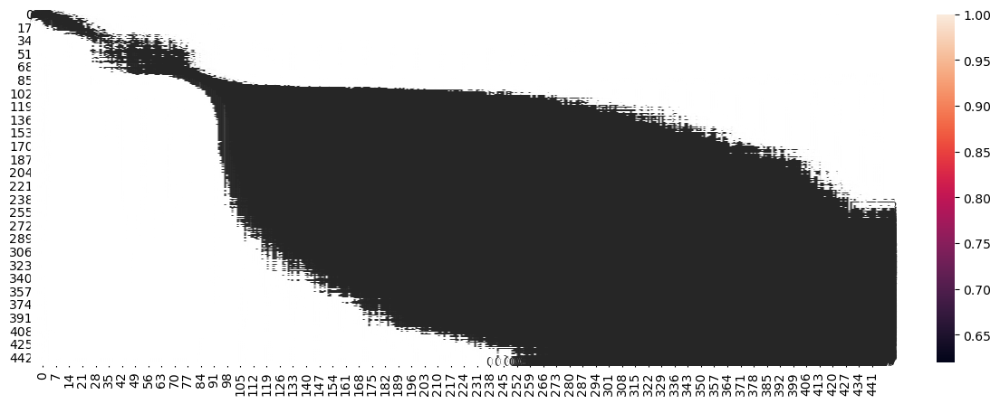

In [35]:
plt.figure(figsize=(15,5))
sns.heatmap(X_transformed_df.corr(),annot = True)

## Chi Square Test


In [37]:
X = x.drop(columns=['vomitoxin_ppb'])  
y = x['vomitoxin_ppb']

In [38]:
X.shape,y.shape

((500, 449), (500,))

In [39]:
from sklearn.feature_selection import SelectKBest,f_regression
#numerical features
X_num = X.select_dtypes(exclude='object')

# Apply SelectKBest with f_regression for continuous target variable
sel_feat = SelectKBest(f_regression, k=7)
X_selected = sel_feat.fit_transform(X_num, y)

# Get selected feature names
imp_feat = X_num.columns[sel_feat.get_support()]
imp_feat

Index(['120', '127', '135', '140', '143', '146', '149'], dtype='object')

## Mutual Information

In [41]:
X_transformed_df.head()

,0,1,2,3,4,5,6,7,8,9,...,438,439,440,441,442,443,444,445,446,447
0,-0.602959,-0.965751,-0.543093,-1.157165,-0.742877,-1.052805,-1.138474,-1.291257,-1.128080,-0.647413,...,-1.136301,-0.579796,-0.435043,-0.472136,-0.641236,-0.807712,-0.858033,-0.499055,-0.738140,-0.619071
1,-0.611562,-0.831331,-0.683547,-0.654183,-0.480564,-0.510221,-0.678841,-0.826155,-0.462121,-0.691024,...,-0.754022,-1.071488,-0.811826,-0.715506,-0.814737,-0.726845,-1.145151,-0.766827,-0.759125,-0.904192
2,-1.210868,-1.529537,-1.328061,-1.135296,-1.277202,-1.403752,-1.618288,-1.577331,-1.492895,-1.516409,...,-1.311275,-1.089395,-1.333533,-1.437541,-1.186149,-1.183869,-1.546059,-1.470599,-1.231647,-1.344393
3,0.575693,0.714559,0.637270,0.721659,0.940964,1.060639,1.176304,0.638522,0.488863,0.540156,...,-0.256030,0.028574,-0.186753,-0.068313,-0.181179,0.216860,-0.004504,0.076859,0.315411,-0.085268
4,0.900614,1.022832,0.772988,1.336847,0.992857,0.866564,1.177082,0.936845,0.737234,0.940551,...,0.677745,0.542282,0.600180,0.390096,0.442627,0.423396,0.098487,0.689182,0.422178,0.256052


In [43]:
X_trans = X_transformed_df 
y = x['vomitoxin_ppb'] 

In [44]:
from sklearn.feature_selection import mutual_info_regression
sel_feat = mutual_info_regression(X_trans, y)
sel_feat

array([0.04858786, 0.03055721, 0.03828666, 0.0298049 , 0.01779744,
       0.09567144, 0.02282917, 0.09421276, 0.07176253, 0.06168432,
       0.0941477 , 0.03134867, 0.0217984 , 0.01919846, 0.04818006,
       0.03835018, 0.02403062, 0.03234512, 0.07604019, 0.08172784,
       0.03791336, 0.05649736, 0.05304348, 0.01092241, 0.03081778,
       0.05263306, 0.05914713, 0.04999662, 0.0355627 , 0.03479229,
       0.05984505, 0.        , 0.01755373, 0.09895199, 0.04545839,
       0.09143589, 0.03466192, 0.        , 0.05162358, 0.01860199,
       0.04491588, 0.06450207, 0.02211698, 0.08624368, 0.02984746,
       0.04135964, 0.0925814 , 0.04905842, 0.06310243, 0.06786701,
       0.0211362 , 0.03053337, 0.13494977, 0.08072936, 0.07365332,
       0.054804  , 0.05564154, 0.04085261, 0.04906624, 0.08212914,
       0.06118863, 0.0209924 , 0.03124419, 0.00834576, 0.09393075,
       0.04278446, 0.00930192, 0.04891551, 0.01903187, 0.00730254,
       0.03539939, 0.07778032, 0.03069591, 0.04873094, 0.     

In [45]:
imp_feat = pd.Series(sel_feat, index=X_trans.columns)
imp_feat_sorted = imp_feat.sort_values(ascending=False)
imp_feat_sorted

146    0.185585
149    0.160687
144    0.149259
256    0.134962
52     0.134950
         ...   
221    0.000000
74     0.000000
405    0.000000
80     0.000000
419    0.000000
Length: 448, dtype: float64

## Variance threshold 

In [47]:
from sklearn.feature_selection import VarianceThreshold
sel_feat = VarianceThreshold(threshold=1)
X_selected = sel_feat.fit_transform(X_trans)
imp_feat = X_trans.columns[sel_feat.get_support()]
imp_feat

Index(['2', '9', '12', '13', '14', '15', '17', '23', '28', '33',
       ...
       '400', '408', '409', '411', '414', '419', '422', '438', '443', '445'],
      dtype='object', length=143)

In [48]:
# Print variance of each feature in X_trans
for i in X_trans.columns:
    print(f'{i} : {X_trans[i].var()}')

0 : 1.0020040080160326
1 : 1.0020040080160317
2 : 1.0020040080160328
3 : 1.002004008016033
4 : 1.0020040080160315
5 : 1.0020040080160322
6 : 1.0020040080160317
7 : 1.0020040080160317
8 : 1.0020040080160313
9 : 1.0020040080160324
10 : 1.0020040080160315
11 : 1.0020040080160326
12 : 1.002004008016033
13 : 1.0020040080160317
14 : 1.0020040080160328
15 : 1.0020040080160326
16 : 1.002004008016032
17 : 1.0020040080160326
18 : 1.0020040080160315
19 : 1.0020040080160324
20 : 1.0020040080160313
21 : 1.0020040080160315
22 : 1.0020040080160333
23 : 1.0020040080160313
24 : 1.0020040080160313
25 : 1.0020040080160326
26 : 1.0020040080160317
27 : 1.002004008016031
28 : 1.002004008016033
29 : 1.0020040080160315
30 : 1.0020040080160324
31 : 1.0020040080160322
32 : 1.0020040080160328
33 : 1.0020040080160317
34 : 1.0020040080160315
35 : 1.0020040080160317
36 : 1.0020040080160317
37 : 1.0020040080160328
38 : 1.0020040080160317
39 : 1.0020040080160328
40 : 1.0020040080160317
41 : 1.0020040080160317
42 : 1.

## Recursive Feature Extraction

In [49]:
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
lr = LinearRegression()
sel_feat = RFE(lr, n_features_to_select=250)
X_selected = sel_feat.fit_transform(X_trans, y)
imp_feat = X_trans.columns[sel_feat.get_support()]
imp_feat

Index(['4', '5', '8', '10', '11', '12', '13', '19', '20', '23',
       ...
       '433', '434', '436', '437', '438', '442', '443', '444', '445', '447'],
      dtype='object', length=250)

In [50]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.feature_selection import RFE
dt = DecisionTreeRegressor()
sel_feat = RFE(dt, n_features_to_select=250)
X_selected = sel_feat.fit_transform(X_trans, y)
imp_feat = X_trans.columns[sel_feat.get_support()]
imp_feat

Index(['7', '8', '9', '10', '11', '12', '13', '14', '15', '16',
       ...
       '433', '434', '435', '436', '439', '440', '441', '442', '443', '445'],
      dtype='object', length=250)

In [51]:
# Decision Tree
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier(max_depth=9)
dt.fit(X_trans, y)
sel_feat = dt.feature_importances_
sel_feat

array([0.        , 0.01501481, 0.        , 0.        , 0.        ,
       0.        , 0.01302938, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.00682492, 0.        ,
       0.        , 0.        , 0.        , 0.03470633, 0.        ,
       0.02659332, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.01906101, 0.        , 0.        ,
       0.        , 0.01228485, 0.02876136, 0.01406532, 0.        ,
       0.        , 0.        , 0.01987591, 0.01338983, 0.01819154,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.01353972, 0.        , 0.        ,
       0.01334983, 0.        , 0.        , 0.        , 0.03601467,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.02191418,
       0.        , 0.        , 0.01303984, 0.        , 0.02463

In [52]:
imp_feat = pd.Series(sel_feat, index=X_trans.columns)
imp_feat_sorted = imp_feat.sort_values(ascending=False)
imp_feat_sorted

99     0.054083
100    0.052586
164    0.037406
59     0.036015
18     0.034706
         ...   
167    0.000000
166    0.000000
165    0.000000
163    0.000000
447    0.000000
Length: 448, dtype: float64

## Assigning Target and Predictor :

In [53]:
x.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Columns: 450 entries, hsi_id to vomitoxin_ppb
dtypes: float64(449), object(1)
memory usage: 1.7+ MB


In [59]:
# Selecting relevant feature columns
X = x.drop(columns=['hsi_id', 'vomitoxin_ppb'])
y = x['vomitoxin_ppb']
X.shape, y.shape

((500, 448), (500,))

In [60]:
X.head()

,0,1,2,3,4,5,6,7,8,9,...,438,439,440,441,442,443,444,445,446,447
0,0.416181,0.396844,0.408985,0.372865,0.385293,0.365390,0.355226,0.343350,0.344837,0.361567,...,0.680883,0.710280,0.717482,0.715078,0.705379,0.696691,0.692793,0.711369,0.697679,0.704520
1,0.415797,0.402956,0.402564,0.396014,0.397192,0.389634,0.375671,0.363689,0.373883,0.359674,...,0.701600,0.684011,0.697271,0.701995,0.696077,0.701012,0.677418,0.696921,0.696544,0.689054
2,0.389023,0.371206,0.373098,0.373872,0.361056,0.349709,0.333882,0.330841,0.328925,0.323854,...,0.671400,0.683054,0.669286,0.663179,0.676165,0.676591,0.655951,0.658945,0.670989,0.665176
3,0.468837,0.473255,0.462949,0.459335,0.461672,0.459824,0.458194,0.427737,0.415360,0.413106,...,0.728588,0.742782,0.730801,0.736787,0.730044,0.751437,0.738497,0.742446,0.754657,0.733474
4,0.483352,0.487274,0.469153,0.487648,0.464026,0.451152,0.458229,0.440782,0.426193,0.430482,...,0.779194,0.770227,0.773013,0.761431,0.763488,0.762473,0.744012,0.775486,0.760431,0.751988


In [64]:
y.head()

0    1100.0
1    1000.0
2    1300.0
3    1300.0
4     220.0
Name: vomitoxin_ppb, dtype: float64

## Train Test Split

In [65]:
from sklearn.model_selection import train_test_split
X_train , X_test , y_train , y_test = train_test_split(X,y,test_size = 0.2, random_state = 34)
X_train.shape , X_test.shape , y_train.shape , y_test.shape

((400, 448), (100, 448), (400,), (100,))

In [66]:
X_train.head()

,0,1,2,3,4,5,6,7,8,9,...,438,439,440,441,442,443,444,445,446,447
88,0.431418,0.423808,0.438341,0.409270,0.417630,0.409353,0.370524,0.388577,0.400831,0.393408,...,0.707767,0.698077,0.713603,0.694937,0.714561,0.700888,0.694897,0.707696,0.694632,0.691765
313,0.415815,0.417290,0.415709,0.372851,0.354332,0.365113,0.336204,0.330260,0.356949,0.329543,...,0.718921,0.706636,0.721437,0.727780,0.722667,0.716298,0.722501,0.720310,0.730182,0.711995
94,0.426527,0.438814,0.397135,0.374683,0.411324,0.384956,0.390344,0.386775,0.362727,0.353334,...,0.738958,0.733054,0.726143,0.727462,0.735195,0.728026,0.727189,0.723131,0.732412,0.711940
110,0.424160,0.428974,0.429438,0.373616,0.393591,0.390175,0.375000,0.369541,0.370533,0.351790,...,0.736900,0.709322,0.730415,0.710112,0.712061,0.718047,0.717178,0.745870,0.712733,0.713644
315,0.471748,0.455698,0.454695,0.444399,0.451935,0.424130,0.430456,0.438969,0.408790,0.422430,...,0.748114,0.746814,0.746059,0.754664,0.738490,0.763016,0.743210,0.740572,0.746439,0.762018


In [67]:
y.head()

0    1100.0
1    1000.0
2    1300.0
3    1300.0
4     220.0
Name: vomitoxin_ppb, dtype: float64

In [70]:
from sklearn.model_selection import train_test_split
X_train_trans , X_test_trans , y_train , y_test = train_test_split(X_trans,y,test_size = 0.2, random_state = 34)
X_train_trans.shape , X_test_trans.shape , y_train.shape , y_test.shape

((400, 448), (100, 448), (400,), (100,))

In [71]:
X_train_trans.head()

,0,1,2,3,4,5,6,7,8,9,...,438,439,440,441,442,443,444,445,446,447
88,-0.261895,-0.372794,0.099012,-0.366149,-0.029982,-0.068915,-0.794548,-0.256997,0.155756,0.086280,...,-0.640225,-0.808207,-0.507355,-0.846796,-0.469975,-0.729150,-0.818733,-0.567130,-0.794472,-0.854213
313,-0.611157,-0.516134,-0.396021,-1.157478,-1.425451,-1.059004,-1.566079,-1.590604,-0.850359,-1.385309,...,-0.434422,-0.648003,-0.361318,-0.235856,-0.318788,-0.440761,-0.303226,-0.333369,-0.137135,-0.481251
94,-0.371364,-0.042805,-0.802296,-1.117676,-0.169013,-0.614902,-0.348995,-0.298200,-0.717882,-0.837117,...,-0.064694,-0.153517,-0.273587,-0.241770,-0.085104,-0.221282,-0.215674,-0.281083,-0.095897,-0.482267
110,-0.424359,-0.259205,-0.095716,-1.140857,-0.559939,-0.498115,-0.693945,-0.692325,-0.538916,-0.872695,...,-0.102671,-0.597721,-0.193944,-0.564508,-0.516597,-0.408029,-0.402640,0.140315,-0.459782,-0.450849
315,0.640855,0.328466,0.456737,0.397132,0.726311,0.261812,0.552750,0.895386,0.338231,0.755001,...,0.104257,0.104046,0.097708,0.264233,-0.023638,0.433559,0.083514,0.042137,0.163466,0.440958


In [72]:
y.head()

0    1100.0
1    1000.0
2    1300.0
3    1300.0
4     220.0
Name: vomitoxin_ppb, dtype: float64

## Regression Models:

Linear Regression
Ridge Regression
Lasso Regression
Decision Tree Regressor
Random Forest Regressor
Gradient Boosting Regressor
Support Vector Regressor (SVR)
XGBoost Regressor

## Linear Regression

In [76]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
model = LinearRegression()
model.fit(X_train_trans, y_train)

# Make predictions
y_pred = model.predict(X_test_trans)

# Evaluate the model
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

# Print evaluation metrics
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
print(f"R² Score: {r2:.4f}")

Mean Absolute Error (MAE): 27168.4402
Mean Squared Error (MSE): 1092503925.8189
Root Mean Squared Error (RMSE): 33053.0471
R² Score: -12.7195


## Decision Tree Regression without hyperparameter tuning

In [78]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
model = DecisionTreeRegressor()
model.fit(X_train_trans, y_train)

# Make predictions
y_pred = model.predict(X_test_trans)

# Evaluate the model
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

# Print evaluation metrics
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
print(f"R² Score: {r2:.4f}")

Mean Absolute Error (MAE): 2462.0700
Mean Squared Error (MSE): 60835438.4900
Root Mean Squared Error (RMSE): 7799.7076
R² Score: 0.2360


## Decision Tree Regression (With Hyperparameter Tuning using GridSearchCV)

In [79]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
hyper_params = {'max_depth': [i for i in range(1, 11)]}
gcv = GridSearchCV(
    estimator=DecisionTreeRegressor(),
    param_grid=hyper_params,
    cv=5,
    scoring="r2", 
    return_train_score=True,
    verbose=True
)
gcv.fit(X_train_trans, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


GridSearchCV(cv=5, estimator=DecisionTreeRegressor(),
             param_grid={'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]},
             return_train_score=True, scoring='r2', verbose=True)

In [80]:
# Best model details
print("Best Estimator:", gcv.best_estimator_)
print("Best Parameters:", gcv.best_params_)
print("Best Score (R²):", gcv.best_score_)

Best Estimator: DecisionTreeRegressor(max_depth=1)
Best Parameters: {'max_depth': 1}
Best Score (R²): -2.060988018942515


In [82]:
# Train final model with best parameters
dt_best = DecisionTreeRegressor(max_depth=gcv.best_params_["max_depth"])
dt_best.fit(X_train_trans, y_train)

#Predict
y_train_pred = dt_best.predict(X_train_trans)
y_test_pred = dt_best.predict(X_test_trans)

# Evaluation Metrics
train_r2 = r2_score(y_train, y_train_pred)
train_mae = mean_absolute_error(y_train, y_train_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Train R² Score: {train_r2:.4f}")
print(f"Train MAE: {train_mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

Train R² Score: 0.3168
Train MAE: 4315.8258
Mean Squared Error (MSE): 60835438.4900
Root Mean Squared Error (RMSE): 7799.7076


In [83]:
from sklearn.model_selection import RandomizedSearchCV

hyper_para = {'max_depth' : [i for i in range(1,11)]}
rsv = RandomizedSearchCV(
                          estimator= DecisionTreeClassifier(),
                          param_distributions= hyper_para,
                          cv = 5,
                          scoring = 'accuracy',
                          return_train_score= True,
                          verbose= True,
                          n_iter = 7)

rsv.fit(X_train_trans, y_train)

Fitting 5 folds for each of 7 candidates, totalling 35 fits


C:\Users\DELL\anaconda3\Lib\site-packages\sklearn\model_selection\_split.py:737: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=5.



RandomizedSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_iter=7,
                   param_distributions={'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9,
                                                      10]},
                   return_train_score=True, scoring='accuracy', verbose=True)

In [85]:
# Best model details
print("Best Estimator:", rsv.best_estimator_)
print("Best Parameters:", rsv.best_params_)
print("Best Score (R²):", rsv.best_score_)

Best Estimator: DecisionTreeClassifier(max_depth=2)
Best Parameters: {'max_depth': 2}
Best Score (R²): 0.17250000000000001


In [86]:
# Train final model with best parameters
dt_best = DecisionTreeRegressor(max_depth=rsv.best_params_["max_depth"])
dt_best.fit(X_train_trans, y_train)

#Predict
y_train_pred = dt_best.predict(X_train_trans)
y_test_pred = dt_best.predict(X_test_trans)

# Evaluation Metrics
train_r2 = r2_score(y_train, y_train_pred)
train_mae = mean_absolute_error(y_train, y_train_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Train R² Score: {train_r2:.4f}")
print(f"Train MAE: {train_mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

Train R² Score: 0.7002
Train MAE: 3234.2770
Mean Squared Error (MSE): 60835438.4900
Root Mean Squared Error (RMSE): 7799.7076


## Random Forest regression without hypermeter tuning

In [88]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
rf = RandomForestRegressor(random_state=42)  
rf.fit(X_train_trans, y_train)

#predict
y_train_pred = rf.predict(X_train_trans)
y_test_pred = rf.predict(X_test_trans)

#Evalation Metrics
train_r2 = r2_score(y_train, y_train_pred)
train_mae = mean_absolute_error(y_train, y_train_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)


print(f"Train R² Score: {train_r2:.4f}")
print(f"Train MAE: {train_mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

Train R² Score: 0.9082
Train MAE: 1422.8756
Mean Squared Error (MSE): 60835438.4900
Root Mean Squared Error (RMSE): 7799.7076


## Gradient Boosting Regression

In [94]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Initialize and train the Gradient Boosting Regressor with default parameters
gbr = GradientBoostingRegressor(random_state=42) 
gbr.fit(X_train_trans, y_train)

# Predictions
y_train_pred = gbr.predict(X_train_trans)


# Evaluation Metrics
train_r2 = r2_score(y_train, y_train_pred)
train_mae = mean_absolute_error(y_train, y_train_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Train R² Score: {train_r2:.4f}")
print(f"Train MAE: {train_mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

Train R² Score: 0.9983
Train MAE: 446.9148
Mean Squared Error (MSE): 60835438.4900
Root Mean Squared Error (RMSE): 7799.7076


## Support Vector Regressor (SVR)

In [93]:
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Initialize and train the Support Vector Regressor with default parameters
svr = SVR()
svr.fit(X_train_trans, y_train)

# Predictions
y_train_pred = svr.predict(X_train_trans)

# Evaluation Metrics
train_r2 = r2_score(y_train, y_train_pred)
train_mae = mean_absolute_error(y_train, y_train_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Train R² Score: {train_r2:.4f}")
print(f"Train MAE: {train_mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

Train R² Score: -0.0519
Train MAE: 3512.9679
Mean Squared Error (MSE): 60835438.4900
Root Mean Squared Error (RMSE): 7799.7076


## XGBoost Regressor

In [96]:
!pip install xgboost

   ---------------------------------------- 0.0/124.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/124.9 MB 1.4 MB/s eta 0:01:32
   ---------------------------------------- 0.3/124.9 MB 3.7 MB/s eta 0:00:34
   ---------------------------------------- 1.0/124.9 MB 7.5 MB/s eta 0:00:17
    --------------------------------------- 1.6/124.9 MB 9.5 MB/s eta 0:00:13
    --------------------------------------- 2.4/124.9 MB 11.6 MB/s eta 0:00:11
    --------------------------------------- 3.0/124.9 MB 11.4 MB/s eta 0:00:11
   - -------------------------------------- 3.9/124.9 MB 12.5 MB/s eta 0:00:10
   - -------------------------------------- 4.2/124.9 MB 11.6 MB/s eta 0:00:11
   - -------------------------------------- 4.8/124.9 MB 11.9 MB/s eta 0:00:11
   - -------------------------------------- 5.4/124.9 MB 12.0 MB/s eta 0:00:10
   - -------------------------------------- 5.9/124.9 MB 11.8 MB/s eta 0:00:11
   -- ------------------------------------- 6.5/124.9 MB 11.8 MB

In [97]:
import xgboost as xgb
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Initialize XGBoost Regressor with default parameters
xgb_reg = xgb.XGBRegressor(objective="reg:squarederror", random_state=42)

# Train the model
xgb_reg.fit(X_train_trans, y_train)

# Predictions
y_train_pred = xgb_reg.predict(X_train_trans)

# Evaluation Metrics
train_r2 = r2_score(y_train, y_train_pred)
train_mae = mean_absolute_error(y_train, y_train_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Train R² Score: {train_r2:.4f}")
print(f"Train MAE: {train_mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")


Train R² Score: 1.0000
Train MAE: 0.1600
Mean Squared Error (MSE): 60835438.4900
Root Mean Squared Error (RMSE): 7799.7076


## Dimensionality Reduction Using PCA and t-SNE with Interpretation
Dimensionality reduction techniques like PCA (Principal Component Analysis) and t-SNE (t-distributed Stochastic Neighbor Embedding) help visualize high-dimensional data in a lower-dimensional space while preserving important structures.

## PCA: Principal Component Analysis
PCA reduces dimensions by identifying key features that explain the most variance in the data.

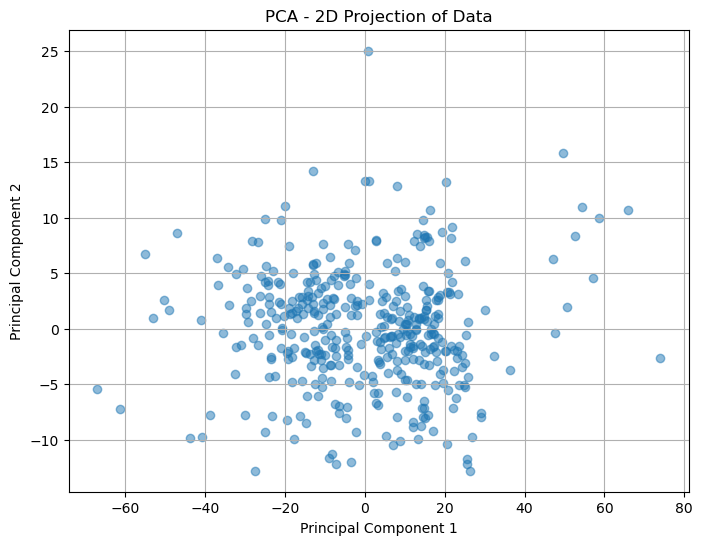

Explained Variance by PC1: 87.01%
Explained Variance by PC2: 5.96%


In [101]:
from sklearn.decomposition import PCA

# Apply PCA
pca = PCA(n_components=2) 
X_pca = pca.fit_transform(X_train_trans)

# Plot PCA results
plt.figure(figsize=(8,6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], alpha=0.5)
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("PCA - 2D Projection of Data")
plt.grid()
plt.show()

# Explained variance
explained_variance = pca.explained_variance_ratio_
print(f"Explained Variance by PC1: {explained_variance[0]*100:.2f}%")
print(f"Explained Variance by PC2: {explained_variance[1]*100:.2f}%")


## t-SNE: t-Distributed Stochastic Neighbor Embedding
t-SNE is a nonlinear dimensionality reduction technique best suited for visualizing clusters in high-dimensional data.

from sklearn.manifold import TSNE

# Apply t-SNE (reducing to 2D)
tsne = TSNE(n_components=2, perplexity=30, random_state=42, n_iter=1000)
X_tsne = tsne.fit_transform(X_train_trans)

# Plot t-SNE results
plt.figure(figsize=(8,6))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], alpha=0.5)
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.title("t-SNE - 2D Projection of Data")
plt.grid()
plt.show()


## Integratation of PCA & t-SNE into your ML pipeline step by step. 

## Step 1: Apply PCA for Dimensionality Reduction
We'll reduce dimensions while retaining 90%+ variance.

In [105]:
from sklearn.decomposition import PCA

# Apply PCA
pca = PCA(n_components=0.90)  # Retain 90% variance
X_train_pca = pca.fit_transform(X_train_trans)
X_test_pca = pca.transform(X_test_trans)

# Check variance explained by top components
explained_variance = pca.explained_variance_ratio_.sum()
print(f'Total Variance Retained: {explained_variance * 100:.2f}%')

# Number of components selected
print(f'Number of PCA Components Used: {pca.n_components_}')

Total Variance Retained: 92.97%
Number of PCA Components Used: 2


## Step 2: Visualize PCA Components
We’ll plot the first 2 principal components to check patterns.

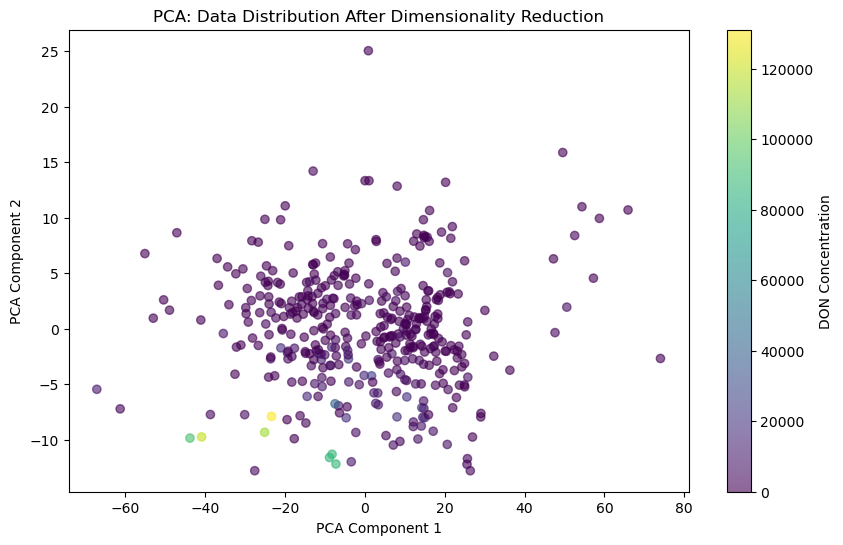

In [107]:
plt.figure(figsize=(10, 6))
plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c=y_train, cmap='viridis', alpha=0.6)
plt.colorbar(label="DON Concentration")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.title("PCA: Data Distribution After Dimensionality Reduction")
plt.show()

## Step 3: Apply t-SNE for Visualization
t-SNE helps visualize nonlinear relationships in high-dimensional data.

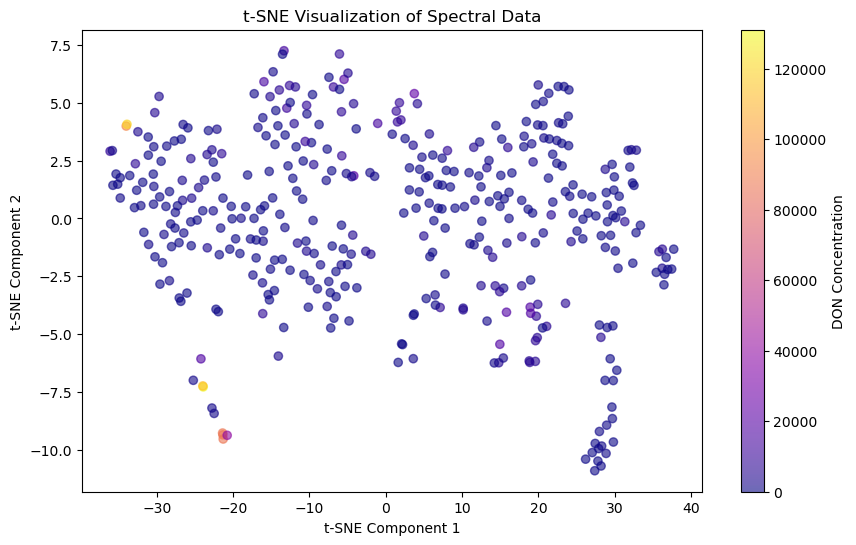

In [108]:
from sklearn.manifold import TSNE

# Reduce dimensions to 2 for visualization
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
X_train_tsne = tsne.fit_transform(X_train_trans)

# Plot t-SNE results
plt.figure(figsize=(10, 6))
plt.scatter(X_train_tsne[:, 0], X_train_tsne[:, 1], c=y_train, cmap='plasma', alpha=0.6)
plt.colorbar(label="DON Concentration")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.title("t-SNE Visualization of Spectral Data")
plt.show()

## Step 4: Train ML Models with PCA Data
Now, let’s train models using the reduced feature set (PCA-transformed data).

In [109]:
# Train a model using PCA-transformed data
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train_pca, y_train)

# Predictions
y_pred = model.predict(X_test_pca)

# Evaluate
mae = mean_absolute_error(y_test, y_pred)
print(f"Mean Absolute Error (MAE) after PCA: {mae:.2f}")


Mean Absolute Error (MAE) after PCA: 3010.64


## Scatter Plot: Actual vs. Predicted Values (Regression)
A scatter plot helps visualize how well the model predicts values compared to actual ones.

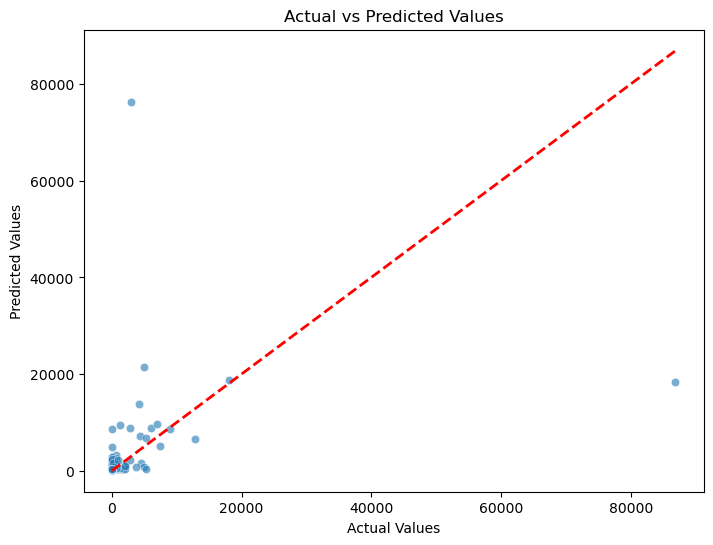

In [111]:
# Scatter plot of Actual vs Predicted values
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.6)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)  # Identity line
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted Values")
plt.show()


## Confusion Matrix (For Classification)
A confusion matrix shows the number of correct and incorrect predictions.

<Figure size 600x600 with 0 Axes>

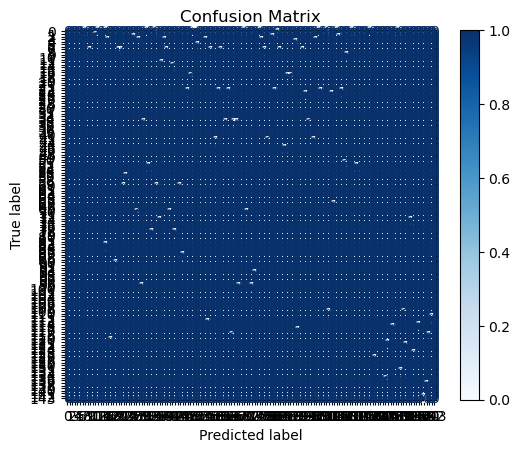

In [116]:
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Convert continuous predictions into discrete labels imagine binary classification
y_pred_class = np.round(y_pred)  # Rounding predictions to the nearest class

# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred_class)

# Plot confusion matrix
plt.figure(figsize=(6, 6))
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap="Blues", values_format='d')
plt.title("Confusion Matrix")
plt.show()



## Summarize Model Performance & Limitations
This section provides a summary of evaluation metrics.

In [117]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Regression Metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)

print("Model Performance Metrics (Regression)")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"R² Score: {r2:.2f}")


Model Performance Metrics (Regression)
Mean Absolute Error (MAE): 3010.64
Mean Squared Error (MSE): 108596041.66
Root Mean Squared Error (RMSE): 10420.94
R² Score: -0.36


## CNN

In [119]:
!pip install tensorflow

  Using cached tensorflow-2.18.0-cp312-cp312-win_amd64.whl.metadata (3.3 kB)
  Using cached tensorflow_intel-2.18.0-cp312-cp312-win_amd64.whl.metadata (4.9 kB)
  Using cached absl_py-2.1.0-py3-none-any.whl.metadata (2.3 kB)
  Using cached astunparse-1.6.3-py2.py3-none-any.whl.metadata (4.4 kB)
  Using cached flatbuffers-25.2.10-py2.py3-none-any.whl.metadata (875 bytes)
  Using cached gast-0.6.0-py3-none-any.whl.metadata (1.3 kB)
  Using cached google_pasta-0.2.0-py3-none-any.whl.metadata (814 bytes)
  Using cached libclang-18.1.1-py2.py3-none-win_amd64.whl.metadata (5.3 kB)
  Using cached opt_einsum-3.4.0-py3-none-any.whl.metadata (6.3 kB)
  Using cached termcolor-2.5.0-py3-none-any.whl.metadata (6.1 kB)
  Using cached grpcio-1.70.0-cp312-cp312-win_amd64.whl.metadata (4.0 kB)
  Using cached tensorboard-2.18.0-py3-none-any.whl.metadata (1.6 kB)
  Using cached ml_dtypes-0.4.1-cp312-cp312-win_amd64.whl.metadata (20 kB)
  Using cached namex-0.0.8-py3-none-any.whl.metadata (246 bytes)
     

In [147]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D,Conv2D,Flatten, Dense, Dropout
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

# Extract features and target variable
X = x.iloc[:, 1:-1].values  
y = x["vomitoxin_ppb"].values 

In [148]:
# Normalize features
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

In [149]:
# Reshape X to fit CNN input (samples, time steps, features)
X_cnn = X_scaled.reshape(X_scaled.shape[0], X_scaled.shape[1], 1)

In [150]:
# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X_cnn, y, test_size=0.2, random_state=42)

In [151]:
# Define CNN model
model = Sequential([
    Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(X_cnn.shape[1], 1)),
    Conv1D(filters=32, kernel_size=3, activation='relu'),
    Flatten(),
    Dense(64, activation='relu'),
    Dropout(0.3),
    Dense(32, activation='relu'),
    Dense(1)  # Regression output layer
])

C:\Users\DELL\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



In [152]:
# Compile model
model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])

In [153]:
# Train the model
history = model.fit(X_train, y_train, epochs=50, batch_size=16, validation_data=(X_test, y_test), verbose=1)

Epoch 1/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 235631248.0000 - mae: 3646.3513 - val_loss: 295787040.0000 - val_mae: 4257.5464
Epoch 2/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 239822384.0000 - mae: 3960.9668 - val_loss: 286802400.0000 - val_mae: 5233.7964
Epoch 3/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 182340160.0000 - mae: 4199.7725 - val_loss: 285689888.0000 - val_mae: 5454.3999
Epoch 4/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 96904960.0000 - mae: 3479.4529 - val_loss: 285622240.0000 - val_mae: 5351.0718
Epoch 5/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 201383008.0000 - mae: 4532.2744 - val_loss: 286544704.0000 - val_mae: 5047.0122
Epoch 6/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 121035360.0000 - mae: 3529.5347 - val_loss: 284565056.0000 - val_mae: 5488.8770
Epoch 7/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 257012016.0000 - mae: 5352.9629 - val_loss: 285628608.0000 - val_mae: 5105.0630
Epoch 8/50
25/25 ━━━━━━━━━━━

In [154]:
# Evaluate model
loss,mae = model.evaluate(X_test, y_test)
loss,mae

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 62380532.0000 - mae: 2729.6626


(77983904.0, 3156.00634765625)

## CNN Code with Early Stopping:
EarlyStopping helps prevent overfitting by stopping training when validation loss stops improving.

In [155]:
# Reshape data for CNN (assuming 1D features -> reshape to 2D for Conv layers)
X_reshaped = X_scaled.reshape(-1, X.shape[1], 1, 1)

In [157]:
# Build CNN Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
model = Sequential([
    Conv2D(32, (3, 1), activation='relu', input_shape=(X.shape[1], 1, 1)),
    MaxPooling2D(pool_size=(2, 1)),
    Conv2D(64, (3, 1), activation='relu'),
    MaxPooling2D(pool_size=(2, 1)),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')  # Use 'softmax' for multi-class classification
])

In [158]:
# Compile model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [159]:
# EarlyStopping & ModelCheckpoint
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
checkpoint = ModelCheckpoint("best_model.h5", monitor="val_loss", save_best_only=True)

In [160]:
# Train the model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=50,
    batch_size=32,
    callbacks=[early_stopping, checkpoint],
    verbose=1
)

Epoch 1/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.0306 - loss: -11297.2764

13/13 ━━━━━━━━━━━━━━━━━━━━ 9s 180ms/step - accuracy: 0.0291 - loss: -12527.2158 - val_accuracy: 0.0000e+00 - val_loss: -103439.3984
Epoch 2/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.0000e+00 - loss: -134958.7812

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - accuracy: 0.0000e+00 - loss: -139908.1719 - val_accuracy: 0.0000e+00 - val_loss: -524348.5000
Epoch 3/50
12/13 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - accuracy: 0.0000e+00 - loss: -645691.4375

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - accuracy: 0.0000e+00 - loss: -659899.6250 - val_accuracy: 0.0000e+00 - val_loss: -1807402.1250
Epoch 4/50
12/13 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - accuracy: 0.0000e+00 - loss: -1769048.8750

13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - accuracy: 0.0000e+00 - loss: -1856919.1250 - val_accuracy: 0.0000e+00 - val_loss: -5000147.5000
Epoch 5/50
12/13 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.0000e+00 - loss: -3922672.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.0000e+00 - loss: -4248553.5000 - val_accuracy: 0.0000e+00 - val_loss: -11922431.0000
Epoch 6/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.0000e+00 - loss: -11781763.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 104ms/step - accuracy: 0.0000e+00 - loss: -11893371.0000 - val_accuracy: 0.0000e+00 - val_loss: -26229988.0000
Epoch 7/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.0000e+00 - loss: -23647828.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - accuracy: 0.0000e+00 - loss: -23989906.0000 - val_accuracy: 0.0000e+00 - val_loss: -52070352.0000
Epoch 8/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.0000e+00 - loss: -41182488.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 89ms/step - accuracy: 0.0000e+00 - loss: -42002596.0000 - val_accuracy: 0.0000e+00 - val_loss: -97229648.0000
Epoch 9/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.0000e+00 - loss: -94183256.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.0000e+00 - loss: -94430536.0000 - val_accuracy: 0.0000e+00 - val_loss: -170432208.0000
Epoch 10/50
12/13 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - accuracy: 0.0000e+00 - loss: -166603168.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - accuracy: 0.0000e+00 - loss: -166485136.0000 - val_accuracy: 0.0000e+00 - val_loss: -281247712.0000
Epoch 11/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.0000e+00 - loss: -233737696.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - accuracy: 0.0000e+00 - loss: -236140288.0000 - val_accuracy: 0.0000e+00 - val_loss: -437100832.0000
Epoch 12/50
12/13 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.0000e+00 - loss: -416806208.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - accuracy: 0.0000e+00 - loss: -416539680.0000 - val_accuracy: 0.0000e+00 - val_loss: -655785792.0000
Epoch 13/50
12/13 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - accuracy: 0.0000e+00 - loss: -509092096.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - accuracy: 0.0000e+00 - loss: -526956800.0000 - val_accuracy: 0.0000e+00 - val_loss: -951157056.0000
Epoch 14/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.0000e+00 - loss: -732344832.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - accuracy: 0.0000e+00 - loss: -740824704.0000 - val_accuracy: 0.0000e+00 - val_loss: -1342455296.0000
Epoch 15/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - accuracy: 0.0000e+00 - loss: -948176704.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - accuracy: 0.0000e+00 - loss: -967452416.0000 - val_accuracy: 0.0000e+00 - val_loss: -1841684992.0000
Epoch 16/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.0000e+00 - loss: -1571430144.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - accuracy: 0.0000e+00 - loss: -1574153088.0000 - val_accuracy: 0.0000e+00 - val_loss: -2491337216.0000
Epoch 17/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.0000e+00 - loss: -2121524864.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - accuracy: 0.0000e+00 - loss: -2129745920.0000 - val_accuracy: 0.0000e+00 - val_loss: -3306566400.0000
Epoch 18/50
12/13 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.0000e+00 - loss: -2913476608.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - accuracy: 0.0000e+00 - loss: -2914283264.0000 - val_accuracy: 0.0000e+00 - val_loss: -4348522496.0000
Epoch 19/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.0000e+00 - loss: -3117406464.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.0000e+00 - loss: -3171226624.0000 - val_accuracy: 0.0000e+00 - val_loss: -5549079040.0000
Epoch 20/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - accuracy: 0.0000e+00 - loss: -4641993728.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - accuracy: 0.0000e+00 - loss: -4648772096.0000 - val_accuracy: 0.0000e+00 - val_loss: -7093090304.0000
Epoch 21/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.0000e+00 - loss: -9032217600.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - accuracy: 0.0000e+00 - loss: -8824354816.0000 - val_accuracy: 0.0000e+00 - val_loss: -8889414656.0000
Epoch 22/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - accuracy: 0.0000e+00 - loss: -8134350336.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.0000e+00 - loss: -8092569088.0000 - val_accuracy: 0.0000e+00 - val_loss: -10800987136.0000
Epoch 23/50
12/13 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - accuracy: 0.0000e+00 - loss: -7513675776.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.0000e+00 - loss: -7824697344.0000 - val_accuracy: 0.0000e+00 - val_loss: -12997997568.0000
Epoch 24/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.0000e+00 - loss: -8703631360.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.0000e+00 - loss: -8865714176.0000 - val_accuracy: 0.0000e+00 - val_loss: -15688722432.0000
Epoch 25/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - accuracy: 0.0000e+00 - loss: -11346864128.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.0000e+00 - loss: -11506368512.0000 - val_accuracy: 0.0000e+00 - val_loss: -18881859584.0000
Epoch 26/50
12/13 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - accuracy: 0.0000e+00 - loss: -15203972096.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - accuracy: 0.0000e+00 - loss: -15314972672.0000 - val_accuracy: 0.0000e+00 - val_loss: -22478499840.0000
Epoch 27/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - accuracy: 0.0000e+00 - loss: -15312619520.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.0000e+00 - loss: -15622528000.0000 - val_accuracy: 0.0000e+00 - val_loss: -26439921664.0000
Epoch 28/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.0000e+00 - loss: -20440778752.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - accuracy: 0.0000e+00 - loss: -20565886976.0000 - val_accuracy: 0.0000e+00 - val_loss: -30914582528.0000
Epoch 29/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - accuracy: 0.0000e+00 - loss: -27813324800.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.0000e+00 - loss: -27697070080.0000 - val_accuracy: 0.0000e+00 - val_loss: -35987845120.0000
Epoch 30/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.0000e+00 - loss: -26173884416.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 112ms/step - accuracy: 0.0000e+00 - loss: -26408185856.0000 - val_accuracy: 0.0000e+00 - val_loss: -41294118912.0000
Epoch 31/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.0000e+00 - loss: -33374986240.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - accuracy: 0.0000e+00 - loss: -33343997952.0000 - val_accuracy: 0.0000e+00 - val_loss: -47436488704.0000
Epoch 32/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.0000e+00 - loss: -47801618432.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - accuracy: 0.0000e+00 - loss: -47089725440.0000 - val_accuracy: 0.0000e+00 - val_loss: -54221672448.0000
Epoch 33/50
12/13 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.0000e+00 - loss: -36475383808.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - accuracy: 0.0000e+00 - loss: -37667389440.0000 - val_accuracy: 0.0000e+00 - val_loss: -61396160512.0000
Epoch 34/50
12/13 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - accuracy: 0.0000e+00 - loss: -48198676480.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - accuracy: 0.0000e+00 - loss: -48553984000.0000 - val_accuracy: 0.0000e+00 - val_loss: -69626789888.0000
Epoch 35/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.0000e+00 - loss: -68078276608.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - accuracy: 0.0000e+00 - loss: -67556954112.0000 - val_accuracy: 0.0000e+00 - val_loss: -79435710464.0000
Epoch 36/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - accuracy: 0.0000e+00 - loss: -73822978048.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - accuracy: 0.0000e+00 - loss: -73219153920.0000 - val_accuracy: 0.0000e+00 - val_loss: -90343948288.0000
Epoch 37/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - accuracy: 0.0000e+00 - loss: -57758666752.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.0000e+00 - loss: -58550632448.0000 - val_accuracy: 0.0000e+00 - val_loss: -100703903744.0000
Epoch 38/50
12/13 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.0000e+00 - loss: -73966551040.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - accuracy: 0.0000e+00 - loss: -75329470464.0000 - val_accuracy: 0.0000e+00 - val_loss: -112536657920.0000
Epoch 39/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.0000e+00 - loss: -93757546496.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - accuracy: 0.0000e+00 - loss: -93423108096.0000 - val_accuracy: 0.0000e+00 - val_loss: -126027153408.0000
Epoch 40/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.0000e+00 - loss: -96571277312.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - accuracy: 0.0000e+00 - loss: -96891731968.0000 - val_accuracy: 0.0000e+00 - val_loss: -140868157440.0000
Epoch 41/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - accuracy: 0.0000e+00 - loss: -122175905792.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.0000e+00 - loss: -121949847552.0000 - val_accuracy: 0.0000e+00 - val_loss: -156726476800.0000
Epoch 42/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - accuracy: 0.0000e+00 - loss: -163753361408.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.0000e+00 - loss: -161478017024.0000 - val_accuracy: 0.0000e+00 - val_loss: -174730297344.0000
Epoch 43/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.0000e+00 - loss: -115056082944.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - accuracy: 0.0000e+00 - loss: -116487741440.0000 - val_accuracy: 0.0000e+00 - val_loss: -191387156480.0000
Epoch 44/50
12/13 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.0000e+00 - loss: -131912597504.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.0000e+00 - loss: -135398342656.0000 - val_accuracy: 0.0000e+00 - val_loss: -210035998720.0000
Epoch 45/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - accuracy: 0.0000e+00 - loss: -182362062848.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.0000e+00 - loss: -181463744512.0000 - val_accuracy: 0.0000e+00 - val_loss: -230486458368.0000
Epoch 46/50
12/13 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.0000e+00 - loss: -179229392896.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.0000e+00 - loss: -181061156864.0000 - val_accuracy: 0.0000e+00 - val_loss: -251360755712.0000
Epoch 47/50
12/13 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.0000e+00 - loss: -239376809984.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.0000e+00 - loss: -233193766912.0000 - val_accuracy: 0.0000e+00 - val_loss: -275178520576.0000
Epoch 48/50
12/13 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.0000e+00 - loss: -257593196544.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step - accuracy: 0.0000e+00 - loss: -252306948096.0000 - val_accuracy: 0.0000e+00 - val_loss: -300252889088.0000
Epoch 49/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - accuracy: 0.0000e+00 - loss: -283699347456.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - accuracy: 0.0000e+00 - loss: -280599920640.0000 - val_accuracy: 0.0000e+00 - val_loss: -326351421440.0000
Epoch 50/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.0000e+00 - loss: -260617240576.0000

13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - accuracy: 0.0000e+00 - loss: -261607751680.0000 - val_accuracy: 0.0000e+00 - val_loss: -354597437440.0000


In [161]:
# Evaluate model
test_loss, test_acc = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {test_acc:.4f}")

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.0000e+00 - loss: -290578628608.0000
Test Accuracy: 0.0000


In [163]:
# Save the final model
model.save("final_model.keras")